# Training a classifier on a real dataset.

## Task:
We need to train a classifier that determines the type of bicycle on a small dataset of bicycle photos from public sources.

Analyze the data and select the appropriate tools and metrics to address this challenge.

You may use pre-trained models from torchvision.models.
Write a report on the results.

Референс: Train_and_Tensorboard (https://colab.research.google.com/drive/1cBUdb5iZ8klW4MvQz-aM7ekWA4IpsK98)

# Пытаюсь в процессе понять возможности коллаба, опираясь на Train_and_Tensorboard

In [3]:
import torch

print(torch.cuda.is_available())


False


In [4]:
# google drive for storing progress

from google.colab import drive
drive.mount('/content/drive')
!ls -l '/content/drive/My Drive/BikeClassifier'


Mounted at /content/drive
total 231369
-rw------- 1 root root  16354918 Dec  2 14:58 best_model.pt
drwx------ 2 root root      4096 Dec  1 16:37 bike
-rw------- 1 root root 110280897 Dec  7  2020 bt_dataset3.zip
-rw------- 1 root root 110280897 Dec  7  2020 bt_dataset3.zip.1


In [5]:
!pip install GPUtil
import humanize
import GPUtil as GPU
import psutil

def gpu_usage():
    GPUs = GPU.getGPUs()
    if len(GPUs) == 0:
        return False
    gpu = GPUs[0]
    process = psutil.Process(os.getpid())
    print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))

!nvidia-smi


  Preparing metadata (setup.py) ... done
  Created wheel for GPUtil: filename=GPUtil-1.4.0-py3-none-any.whl size=7392 sha256=46e9e55880fad62fb4126df62a5e8f9f3031c5522fe17acaf45104828564913c
  Stored in directory: /root/.cache/pip/wheels/a9/8a/bd/81082387151853ab8b6b3ef33426e98f5cbfebc3c397a9d4d0
Successfully built GPUtil
/bin/bash: line 1: nvidia-smi: command not found


# Data

In [ ]:
! wget http://fmb.images.gan4x4.ru/hse/bt_dataset3.zip
! unzip bt_dataset3.zip

In [6]:
!wget -P '/content/drive/My Drive/BikeClassifier/' http://fmb.images.gan4x4.ru/hse/bt_dataset3.zip
!unzip '/content/drive/My Drive/BikeClassifier/bt_dataset3.zip' -d '/content/drive/My Drive/BikeClassifier/'

!ls -l '/content/drive/My Drive/BikeClassifier/'


--2024-12-02 15:19:45--  http://fmb.images.gan4x4.ru/hse/bt_dataset3.zip
Resolving fmb.images.gan4x4.ru (fmb.images.gan4x4.ru)... 212.24.105.216
Connecting to fmb.images.gan4x4.ru (fmb.images.gan4x4.ru)|212.24.105.216|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 110280897 (105M) [application/zip]
Saving to: ‘/content/drive/My Drive/BikeClassifier/bt_dataset3.zip.2’

bt_dataset3.zip.2   100%[===================>] 105.17M  7.30MB/s    in 29s     

2024-12-02 15:20:16 (3.64 MB/s) - ‘/content/drive/My Drive/BikeClassifier/bt_dataset3.zip.2’ saved [110280897/110280897]

Archive:  /content/drive/My Drive/BikeClassifier/bt_dataset3.zip
replace /content/drive/My Drive/BikeClassifier/bike/bike_type/train/road/road_4884_5fccd8907cba8.jpeg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: /content/drive/My Drive/BikeClassifier/bike/bike_type/train/road/road_4884_5fccd8907cba8.jpeg  
  inflating: /content/drive/My Drive/BikeClassifier/bike/bike_type/train/road/road_

In [7]:
!ls -l '/content/drive/My Drive/BikeClassifier/'


total 339066
-rw------- 1 root root  16354918 Dec  2 14:58 best_model.pt
drwx------ 3 root root      4096 Dec  1 16:37 bike
-rw------- 1 root root 110280897 Dec  7  2020 bt_dataset3.zip
-rw------- 1 root root 110280897 Dec  7  2020 bt_dataset3.zip.1
-rw------- 1 root root 110280897 Dec  7  2020 bt_dataset3.zip.2


In [8]:
!apt-get install tree


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 49 not upgraded.
Need to get 47.9 kB of archives.
After this operation, 116 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tree amd64 2.0.2-1 [47.9 kB]
Fetched 47.9 kB in 1s (44.0 kB/s)
Selecting previously unselected package tree.
(Reading database ... 123630 files and directories currently installed.)
Preparing to unpack .../tree_2.0.2-1_amd64.deb ...
Unpacking tree (2.0.2-1) ...
Setting up tree (2.0.2-1) ...
Processing triggers for man-db (2.10.2-1) ...


In [9]:
!tree -d '/content/drive/My Drive/BikeClassifier/'

/content/drive/My Drive/BikeClassifier/
└── bike
    └── bike_type
        ├── train
        │   ├── bmx
        │   ├── child
        │   ├── city
        │   ├── mtb
        │   └── road
        └── val
            ├── bmx
            ├── child
            ├── city
            ├── mtb
            └── road

14 directories


In [10]:
dataset_train_path = '/content/drive/My Drive/BikeClassifier/bike/bike_type/train'
dataset_val_path = '/content/drive/My Drive/BikeClassifier/bike/bike_type/val'

# Data Analysis

In [11]:
def is_multilabel_dataset(dataset):
    _, label = dataset[0]

    # если метка — число -> датасет одноклассовый
    if isinstance(label, int):
        return False

    # если метка — тензор или список, проверяем его размер
    if isinstance(label, (torch.Tensor, list)) and len(label) > 1:
        return True

    return False


In [12]:
# беглый анализ данных
def show_dataset_info(dataset):
    print("Number of samples in dataset:", len(dataset))                          # кол-во изображений
    print(f"Number of classes: {len(dataset.classes)}")
    print(f"Classes: {dataset.classes}")


In [13]:
import matplotlib.pyplot as plt

# распределение размеров изображений:
def show_dataset_image_size_distribution(dataset):
    # извлечение размеров изображений
    image_sizes = []

    for img, _ in dataset:
        if isinstance(img, torch.Tensor):
            if img.ndimension() == 3:                                             # убедиться, что размерность (C, H, W)
                _, height, width = img.shape
            else:
                raise ValueError(f"Unexpected tensor shape: {img.shape}")
        else:  # PIL
            width, height = img.size

        image_sizes.append((width, height))

    widths, heights = zip(*image_sizes)

    plt.hist(widths, bins=20, alpha=0.5, label='Width', color='blue')
    plt.hist(heights, bins=20, alpha=0.5, label='Height', color='orange')
    plt.title("Image Size Distribution")
    plt.xlabel("Pixels")
    plt.ylabel("Count")
    plt.legend()
    plt.tight_layout()
    plt.show()


In [14]:
import numpy as np

def count_images_per_class_numpy(dataset):
    class_indices = np.array(dataset.targets)
    unique, counts = np.unique(class_indices, return_counts=True)
    index_to_class = {v: k for k, v in dataset.class_to_idx.items()}

    return {index_to_class[cls_idx]: count for cls_idx, count in zip(unique, counts)}


In [15]:
import matplotlib.pyplot as plt
import numpy as np
import os

# распределение классов (balance)
def show_dataset_class_distribution(dataset):
    class_counts = count_images_per_class_numpy(dataset)

    for class_name, count in class_counts.items():
        print(f"Class {class_name}: {count} images")

    # подготовка данных для визуализации
    class_names = list(class_counts.keys())
    counts = list(class_counts.values())

    # построение графика
    plt.bar(range(len(class_names)), counts, color='skyblue', edgecolor='black')
    plt.xticks(range(len(class_names)), class_names, rotation=45, ha='right')
    plt.title("Class Distribution")
    plt.xlabel("Class")
    plt.ylabel("Number of samples")
    plt.tight_layout()
    plt.show()


In [16]:
import matplotlib.pyplot as plt

# посмотреть изображения
def show_images(ds, idx):
    fig, axes = plt.subplots(1, len(idx), figsize=(35, 25))
    for j, n in enumerate(idx):
        image, label = ds[n]
        axes[j].imshow(image)
        axes[j].axis('off')
    plt.show()


In [17]:
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

# загружаем данные для обучения и оценки модели
dataset_train = ImageFolder(root=dataset_train_path)
dataset_val = ImageFolder(root=dataset_val_path)

if is_multilabel_dataset(dataset_train):
    print("dataset is multi-label")
else:
    print("dataset is single-label")


dataset is single-label


In [32]:
show_dataset_info(dataset_train)


Number of samples in dataset: 2290
Number of classes: 5
Classes: ['bmx', 'child', 'city', 'mtb', 'road']


In [33]:
show_dataset_info(dataset_val)


Number of samples in dataset: 461
Number of classes: 5
Classes: ['bmx', 'child', 'city', 'mtb', 'road']


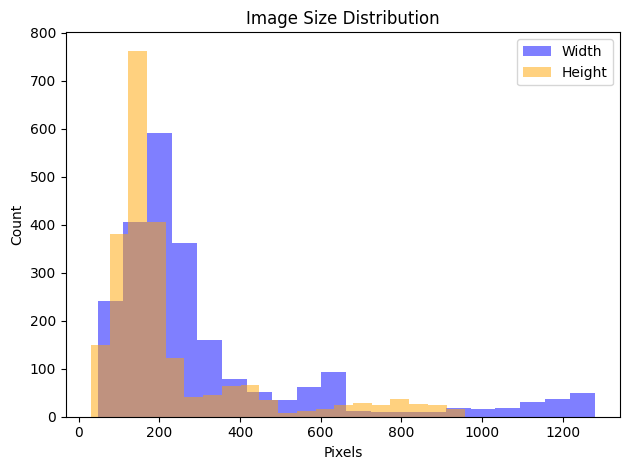

In [34]:
show_dataset_image_size_distribution(dataset_train)


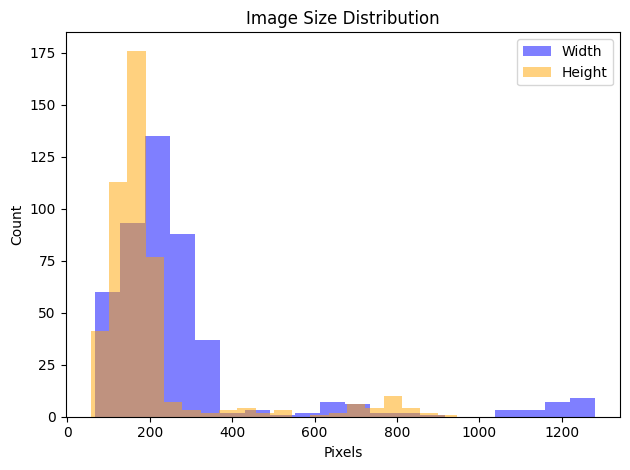

In [35]:
show_dataset_image_size_distribution(dataset_val)


По гистограммам распределения размеров изображений видно, что большинство широт и высот располагаются в районе 200, т.е. от стандартного для предобученных моделей transforms.Resize((224,224)) датасет не пострадает

но для улучшения можно выкинуть из датасета данные, у которых один из показателей менее 100 пикселей (т.к. они при деформации вряд ли что-то полезное покажут)

изображения больших размеров убирать, полагаю, не стоит, т.к. они скорее хорошего качества, т.е. будут полезны в обучении

Class bmx: 109 images
Class child: 115 images
Class city: 714 images
Class mtb: 1016 images
Class road: 336 images


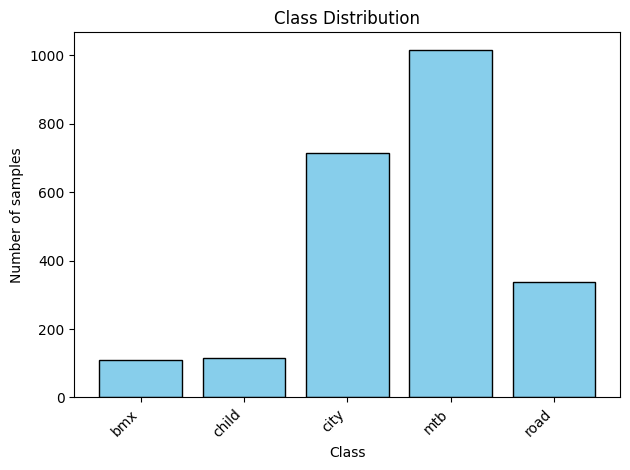

In [36]:
show_dataset_class_distribution(dataset_train)


Class bmx: 3 images
Class child: 21 images
Class city: 196 images
Class mtb: 173 images
Class road: 68 images


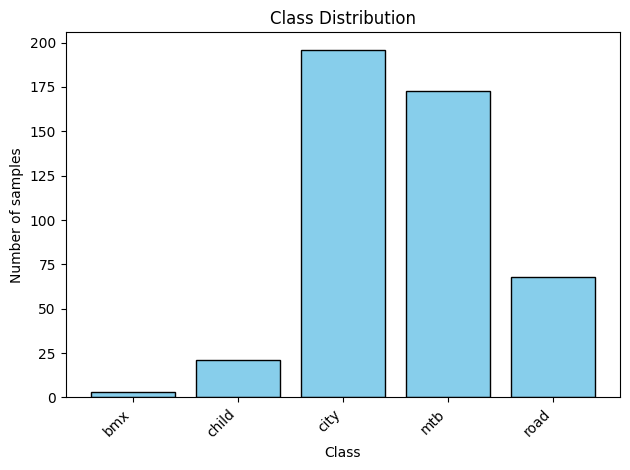

In [37]:
show_dataset_class_distribution(dataset_val)


Как видим, баланс в сделку не входил, и это надо бы пофиксить

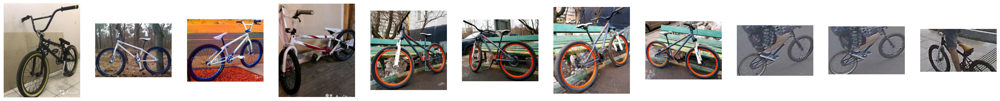

In [38]:
show_images(dataset_train, [0,1,2,3,4,5,6,7,8,9,10])

Есть подозрения, что некоторые изображения не стерильные из-за шума

# Data Preprocessing

Варианты решения проблемы баланса:

⨉Use Offline augmentation – может не решить проблему в корне, если разница между классами слишком велика (115 vs 1016 изображений) + место на диске не резиновое

✓Add weights to classes – можно посчитать веса классов и передать в функцию потерь, чтобы компенсировать дисбаланс классов, увеличив вклад редких классов в расчет ошибки (но лучше Weighted random sampler)

✓Use an adequate metric – есть вариант смотреть Balanced Accuracy (среднее значение Recall для каждого класса) вместо обычного Accuracy + все еще валидная F1 score

In [18]:
from PIL import Image

# выкидываем маленькие картинки
class FilterSmallImages(ImageFolder):
    def __init__(self, root, min_size=100, transform=None, **kwargs):
        super().__init__(root, transform=transform, **kwargs)
        self.min_size = min_size

        # фильтрация изображений
        self.filtered_samples = [
            (path, target) for path, target in self.samples if self._is_valid_image(path)
        ]

        print(f"Total images before filtering: {len(self.samples)}")
        print(f"Total images after filtering: {len(self.filtered_samples)}")

        self.samples = self.filtered_samples
        self.targets = [target for _, target in self.filtered_samples]

    def _is_valid_image(self, path):
        try:
            with Image.open(path) as img:
                width, height = img.size
            return width >= self.min_size and height >= self.min_size
        except Exception as e:
            print(f"Warning: Failed to process image at {path}. Error: {e}")
            return False

    def __len__(self):
        return len(self.filtered_samples)

    def __getitem__(self, idx):
        path, class_idx = self.filtered_samples[idx]
        img = self.loader(path)

        if self.transform:
          img = self.transform(img)

        return img, class_idx

dataset_train_filtered = FilterSmallImages(root=dataset_train_path, min_size=100)
# dataset_val_filtered = FilterSmallImages(root=dataset_val_path, min_size=100)  # фильтрация в целях улучшения обучения (чуть лучше разметка), на val не надо

Total images before filtering: 2290
Total images after filtering: 1940


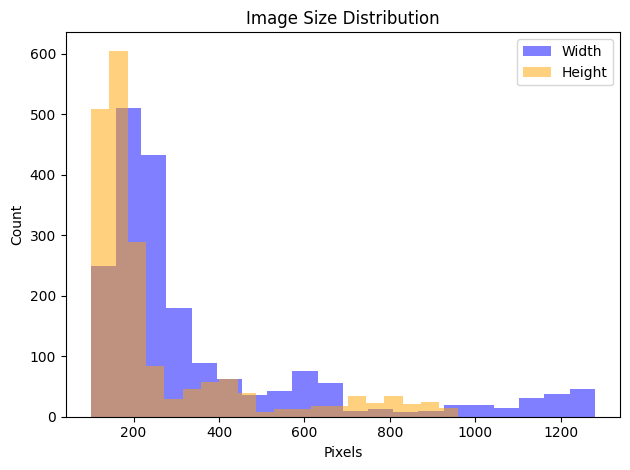

In [40]:
show_dataset_image_size_distribution(dataset_train_filtered)


Class bmx: 52 images
Class child: 45 images
Class city: 623 images
Class mtb: 901 images
Class road: 319 images


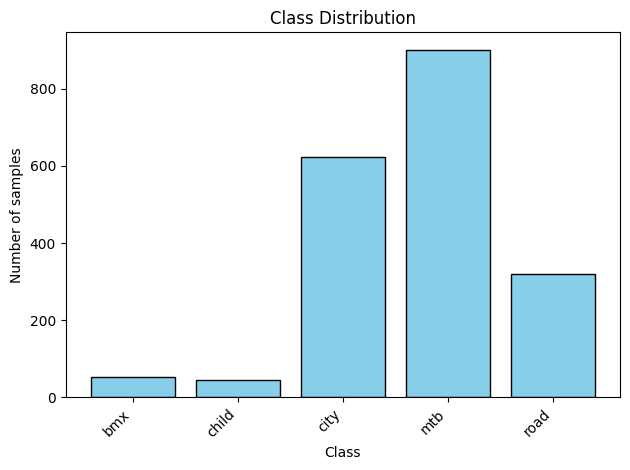

In [41]:
show_dataset_class_distribution(dataset_train_filtered)


In [19]:
# берём из вывода
class_names = ['bmx', 'child', 'city', 'mtb', 'road']
class_counts = [52, 45, 623, 901, 319]
class_count_dict = dict(zip(class_names, class_counts))

# подсчитаем веса
class_weights = [sum(class_counts) / class_count_dict[bike_class] for bike_class in class_names]

print("Class Weights:", class_weights)


Class Weights: [37.30769230769231, 43.111111111111114, 3.113964686998395, 2.153163152053274, 6.081504702194358]


In [20]:
class ConditionalToTensor:
    def __call__(self, pic):
        if isinstance(pic, torch.Tensor):
            return pic  # возвращаем, если это уже тензор
        return transforms.ToTensor()(pic)


In [21]:
import cv2
import numpy as np

class RemoveNoise:
    def __call__(self, img):
        img = np.array(img)
        img_denoised = cv2.fastNlMeansDenoisingColored(img, None, 10, 7, 21)
        return Image.fromarray(img_denoised)


NL-Means помогает удалять шум с сохранением важных деталей изображения. В рамках задачи классификации велосипедов при ограниченном объеме данных может улучшить обучение


In [22]:
from torchvision import transforms

# подчистить шум
transform_train=transforms.Compose([
    RemoveNoise()
])

dataset_train_filtered = FilterSmallImages(root=dataset_train_path, min_size=100, transform=transform_train)


Total images before filtering: 2290
Total images after filtering: 1940


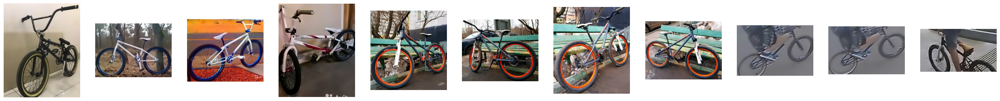

In [46]:
show_images(dataset_train_filtered, [0,1,2,3,4,5,6,7,8,9,10])


Блюрит фон, что полезно

In [23]:
from torchvision import transforms

# настройка преобразований изображений
transform_train=transforms.Compose([
    RemoveNoise(),
    transforms.Resize((224, 224)),                                               # приведение всех изображений к одному размеру
    transforms.RandomHorizontalFlip(),                                           # аугментация
    ConditionalToTensor(),                                                       # преобразование в тензоры
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # нормализация ImageNet mean and STD
])

transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomRotation(5),                                                # аугментация
    ConditionalToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


аугментация со случайными переворотами помогает модели научиться обобщать, это может предотвратить переобучение

для оценки модели аугментация применяется минимально (вращение на фиксированное количество градусов)

In [24]:
# перезагружаем данные с учетом трансформации
dataset_train = FilterSmallImages(root=dataset_train_path, transform=transform_train)
dataset_val = ImageFolder(root=dataset_val_path, transform=transform_val)


Total images before filtering: 2290
Total images after filtering: 1940


In [25]:
# баланс классов на уровне батча
from torch.utils.data import DataLoader,  TensorDataset, WeightedRandomSampler

weight_for_sample = [class_weights[label] for label in dataset_train.targets]

sampler = WeightedRandomSampler(
    weights=torch.tensor(weight_for_sample, dtype=torch.float32),
    num_samples=len(dataset_train)
)


In [26]:
from torch.utils.data import DataLoader

dataloaders = {
    'train' : DataLoader(dataset_train,  batch_size=64, sampler=sampler, num_workers=4, pin_memory=True),
    'val' : DataLoader(dataset_val,  batch_size=16, shuffle = False, num_workers=4, pin_memory=True)
}

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


# Solution

In [27]:
import torch

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [28]:
import os
# Tensorboard setup
logs_base_dir = "tb_runs"
os.makedirs(logs_base_dir, exist_ok=True)
# Clear old tensorboard logs if it exists
!rm -rfv {logs_base_dir}/*
%load_ext tensorboard

In [29]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models

# используем предобученную модель с изменением последнего слоя
def create_model(model_name="resnet18", num_classes=2):
    if model_name == "resnet18":
        model = models.resnet18(pretrained=True)
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif model_name == "efficientnet":
        model = models.efficientnet_b0(pretrained=True)
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
    else:
        raise ValueError(f"Unsupported model: {model_name}")

    return model


In [30]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 12.2 MB/s eta 0:00:00


In [31]:
import time
import copy
import sys

from torchmetrics.classification import Accuracy, Precision, Recall, F1Score, ConfusionMatrix
import torchmetrics

# training function, reference to Train_and_Tensorboard
def train_model(model, dataloaders, criterion, optimizer, num_epochs=10, num_classes=2):
    since = time.time()
    first_step = True

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    accuracy = Accuracy(task='multiclass', num_classes=num_classes, average='weighted').to(device)
    precision = Precision(task='multiclass', num_classes=num_classes, average='weighted').to(device)
    recall = Recall(task='multiclass', num_classes=num_classes, average='weighted').to(device)
    f1_score = F1Score(task='multiclass', num_classes=num_classes, average='weighted').to(device)
    confusion_matrix = ConfusionMatrix(task='multiclass', num_classes=num_classes).to(device)

    for epoch in range(num_epochs):
        print(f'Epoch [{epoch+1}/{num_epochs}] started')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                    # statistics
                    if first_step:
                        writer.add_graph(model,inputs)
                        writer.close()
                        first_step = False

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

                # обновляем метрики на каждом батче
                accuracy.update(preds, labels)
                precision.update(preds, labels)
                recall.update(preds, labels)
                f1_score.update(preds, labels)
                confusion_matrix.update(preds, labels)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            #Write stat to Tensorboard log files
            writer.add_scalars('Loss', { phase : epoch_loss } , epoch)
            #writer.add_scalar('Loss_'+phase,epoch_loss , epoch)
            writer.add_scalars('Accuracy',{ phase : epoch_acc } , epoch)
            writer.close()

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
            print(f'{phase} Accuracy: {accuracy.compute():.4f}')
            print(f'{phase} Precision: {precision.compute():.4f} Recall: {recall.compute():.4f} F1-score: {f1_score.compute():.4f}')
            print(f'{phase} Confusion Matrix:\n{confusion_matrix.compute()}')

            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

                # Backup weights to Google drive
                torch.save(best_model_wts, "/content/drive/My Drive/BikeClassifier/best_model.pt")

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # финальные значения метрик
    final_accuracy = accuracy.compute()
    final_precision = precision.compute()
    final_recall = recall.compute()
    final_f1_score = f1_score.compute()
    final_conf_matrix = confusion_matrix.compute()

    print(f"Accuracy: {final_accuracy}")
    print(f"Precision: {final_precision}")
    print(f"Recall: {final_recall}")
    print(f"F1 Score: {final_f1_score}")
    print("Confusion Matrix:\n", final_conf_matrix)

    model.load_state_dict(best_model_wts)

    return model, best_acc


In [36]:
from torch.utils.tensorboard import SummaryWriter
from datetime import datetime

print ("Device = ",device)

# Writer create subdir for current run
run_dir = logs_base_dir + os.sep + datetime.now().strftime("%Y%m%d-%H%M%S")
writer = SummaryWriter(run_dir,flush_secs=1)

# Launch tensorboard
#%tensorboard --logdir {run_dir}
# to show historical data
%tensorboard --logdir {logs_base_dir}


Device =  cpu


<IPython.core.display.Javascript object>

Подобрать гиперпараметры попробовать хочется, а val датасет трогать не хочется, поэтому делим train

In [33]:
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Subset, TensorDataset, WeightedRandomSampler

# разделяем исходный train на train_optuna и test_optuna (для подбора параметров через Optuna)
train_indices, test_indices = train_test_split(range(len(dataset_train)), test_size=0.3, random_state=42)
train_optuna = Subset(dataset_train, train_indices)
test_optuna = Subset(dataset_train, test_indices)

labels_optuna = [dataset_train.targets[i] for i in train_indices]

sampler_optuna = WeightedRandomSampler(
    weights=torch.tensor(
        [class_weights[label] for label in labels_optuna],
        dtype=torch.float32
    ),
    num_samples=len(train_optuna)
)

# даталоадеры для Optuna
dataloaders_optuna = {
    'train': DataLoader(train_optuna, batch_size=64, sampler=sampler_optuna, num_workers=4, pin_memory=True),
    'val': DataLoader(test_optuna, batch_size=16, shuffle=False, num_workers=4, pin_memory=True),
}


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [1]:
!pip install optuna


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.3 MB/s eta 0:00:00


In [ ]:
import optuna
from optuna import Trial

# подбор гиперпараметров
def objective(trial: Trial):
    model_name = trial.suggest_categorical('model_name', ['resnet18', 'efficientnet'])
    model = create_model(model_name=model_name, num_classes=len(dataset_train.classes))
    model = model.to(device)

    # замораживаем все параметры
    for param in model.parameters():
        param.requires_grad = False

    # размораживаем последний слой
    if model_name == 'efficientnet':
        for param in model.classifier.parameters():
            param.requires_grad = True
    else:  # для resnet
        for param in model.fc.parameters():
            param.requires_grad = True

    lr = 1e-5                                                                     #  маленький шаг при дообучении предобученной модели (Transfer Learning)
    optimizer = optim.Adam(model.parameters(), lr=lr)

    criterion = nn.CrossEntropyLoss()

    model_trained, best_acc = train_model(model, dataloaders_optuna, criterion, optimizer, num_epochs=1, num_classes=len(dataset_train.classes))

    return best_acc

# запуск оптимизации с Optuna
pruner = optuna.pruners.MedianPruner(n_startup_trials=5, n_warmup_steps=0)
study = optuna.create_study(direction='maximize')                                 # максимизация точности
study.optimize(objective, n_trials=10)

print(f"Best parameters: {study.best_params}")


[I 2024-12-02 14:33:30,911] A new study created in memory with name: no-name-5f568078-3ceb-4208-92cd-5f13f485087d
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/1] started
----------


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


train Loss: 1.6075 Acc: 0.2518
train Accuracy: 0.2518
train Precision: 0.2301 Recall: 0.2518 F1-score: 0.2343
train Confusion Matrix:
tensor([[110,  81,  19,  41,  63],
        [ 70,  75,  13,  32,  93],
        [ 64,  35,   8,  52,  68],
        [ 71,  48,  20,  40,  82],
        [ 52,  58,  18,  36, 109]], device='cuda:0')
val Loss: 1.6484 Acc: 0.1890
val Accuracy: 0.2330
val Precision: 0.2261 Recall: 0.2330 F1-score: 0.2132
val Confusion Matrix:
tensor([[113,  83,  20,  44,  65],
        [ 77,  75,  13,  34,  96],
        [113,  67,  15, 105, 121],
        [151,  83,  34, 103, 160],
        [ 72,  68,  24,  58, 146]], device='cuda:0')


[I 2024-12-02 14:58:27,329] Trial 0 finished with value: 0.18900343642611683 and parameters: {'model_name': 'efficientnet'}. Best is trial 0 with value: 0.18900343642611683.



Training complete in 24m 56s
Best val Acc: 0.189003
Accuracy: 0.23298969864845276
Precision: 0.22608420252799988
Recall: 0.23298969864845276
F1 Score: 0.21321478486061096
Confusion Matrix:
 tensor([[113,  83,  20,  44,  65],
        [ 77,  75,  13,  34,  96],
        [113,  67,  15, 105, 121],
        [151,  83,  34, 103, 160],
        [ 72,  68,  24,  58, 146]], device='cuda:0')
Epoch [1/1] started
----------


Подбирать через Optuna модель, наверное, не самая здравая идея (+ коллаб любит в самый ответственный момент врубать лимит на gpu, обидно за подчищенный tensorboard)
Поэтому 1-ю эпоху для resnet18 посмотрим через костыль

In [34]:
import optuna
from optuna import Trial

# подбор гиперпараметров
def objective(trial: Trial):
    model_name = trial.suggest_categorical('model_name', ['resnet18'])
    model = create_model(model_name=model_name, num_classes=len(dataset_train.classes))
    model = model.to(device)

    # замораживаем все параметры
    for param in model.parameters():
        param.requires_grad = False

    # размораживаем последний слой
    if model_name == 'efficientnet':
        for param in model.classifier.parameters():
            param.requires_grad = True
    else:  # для resnet
        for param in model.fc.parameters():
            param.requires_grad = True

    lr = 1e-5                                                                     #  маленький шаг при дообучении предобученной модели (Transfer Learning)
    optimizer = optim.Adam(model.parameters(), lr=lr)

    criterion = nn.CrossEntropyLoss()

    model_trained, best_acc = train_model(model, dataloaders_optuna, criterion, optimizer, num_epochs=1, num_classes=len(dataset_train.classes))

    return best_acc

# запуск оптимизации с Optuna
pruner = optuna.pruners.MedianPruner(n_startup_trials=5, n_warmup_steps=0)
study = optuna.create_study(direction='maximize')                                 # максимизация точности
study.optimize(objective, n_trials=10)

print(f"Best parameters: {study.best_params}")


[I 2024-12-02 15:27:12,714] A new study created in memory with name: no-name-36eac85b-8169-49e2-a36c-e754de0129d1
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 136MB/s]


Epoch [1/1] started
----------
train Loss: 1.7700 Acc: 0.1959
train Accuracy: 0.1959
train Precision: 0.3244 Recall: 0.1959 F1-score: 0.1470
train Confusion Matrix:
tensor([[105,   2,   0, 150,  59],
        [ 94,   2,   0, 117,  33],
        [ 84,  14,   2, 146,  21],
        [ 93,   7,   0, 130,  45],
        [ 95,  17,   0, 115,  27]])
val Loss: 1.7429 Acc: 0.2268
val Accuracy: 0.2052
val Precision: 0.2923 Recall: 0.2052 F1-score: 0.1580
val Confusion Matrix:
tensor([[114,   2,   0, 152,  59],
        [ 99,   2,   0, 122,  35],
        [170,  29,   2, 224,  36],
        [199,  15,   0, 241,  90],
        [138,  23,   1, 148,  39]])


[I 2024-12-02 15:59:26,403] Trial 0 finished with value: 0.2268041237113402 and parameters: {'model_name': 'resnet18'}. Best is trial 0 with value: 0.2268041237113402.



Training complete in 32m 13s
Best val Acc: 0.226804
Accuracy: 0.2051546275615692
Precision: 0.29227107763290405
Recall: 0.2051546275615692
F1 Score: 0.1580081582069397
Confusion Matrix:
 tensor([[114,   2,   0, 152,  59],
        [ 99,   2,   0, 122,  35],
        [170,  29,   2, 224,  36],
        [199,  15,   0, 241,  90],
        [138,  23,   1, 148,  39]])
Epoch [1/1] started
----------


[W 2024-12-02 16:08:43,419] Trial 1 failed with parameters: {'model_name': 'resnet18'} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/optuna/study/_optimize.py", line 197, in _run_trial
    value_or_values = func(trial)
  File "<ipython-input-34-210278ea32c3>", line 27, in objective
    model_trained, best_acc = train_model(model, dataloaders_optuna, criterion, optimizer, num_epochs=1, num_classes=len(dataset_train.classes))
  File "<ipython-input-31-30e1616dcccc>", line 42, in train_model
    outputs = model(inputs)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1736, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1747, in _call_impl
    return forward_call(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/torchvision/models/resnet.py", line 285, in

KeyboardInterrupt: 

In [35]:
!ls -l {logs_base_dir}

total 4
drwxr-xr-x 6 root root 4096 Dec  2 16:04 20241202-152513


По метрикам 1-й эпохи более успешный старт (но всё равно смешной) показывает модель efficientnet, с ней попробуем дальше поработать

In [37]:
# уже вне поиска гиперпараметров обучим на нескольких эпохах
model = create_model(model_name='efficientnet', num_classes=len(dataset_train.classes))
model = model.to(device)

for param in model.parameters():
    param.requires_grad = False

for param in model.classifier.parameters():
    param.requires_grad = True

optimizer = optim.Adam(model.parameters(), lr=1e-5)
criterion = nn.CrossEntropyLoss()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 54.9MB/s]


In [ ]:
model_trained, _ = train_model(
    model,
    dataloaders,
    criterion,
    optimizer,
    num_epochs=10,
    num_classes=len(dataset_train.classes)
)


Epoch [1/10] started
----------


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


train Loss: 1.6265 Acc: 0.2052
train Accuracy: 0.2052
train Precision: 0.2103 Recall: 0.2052 F1-score: 0.1970
train Confusion Matrix:
tensor([[ 62, 151, 101,  57,  20],
        [ 68, 129,  93,  82,  20],
        [ 63, 146,  70,  53,  42],
        [ 52, 136,  51, 103,  40],
        [ 62, 140,  78,  87,  34]])
val Loss: 1.6131 Acc: 0.2169
val Accuracy: 0.2074
val Precision: 0.2173 Recall: 0.2074 F1-score: 0.2027
val Confusion Matrix:
tensor([[ 64, 152, 101,  57,  20],
        [ 78, 134,  94,  86,  21],
        [122, 182, 108,  91,  67],
        [ 84, 180,  87, 154,  50],
        [ 79, 162,  90, 100,  38]])

Epoch [2/10] started
----------
train Loss: 1.6182 Acc: 0.2196
train Accuracy: 0.2129
train Precision: 0.2189 Recall: 0.2129 F1-score: 0.2069
train Confusion Matrix:
tensor([[122, 290, 192, 107,  43],
        [143, 273, 177, 169,  41],
        [195, 304, 188, 138, 126],
        [153, 307, 157, 263,  92],
        [148, 299, 158, 178,  78]])
val Loss: 1.6102 Acc: 0.2017
val Accuracy: 0.

2 часа 19 минут 48 секунд даже на 4 эпохи не хватило, один перерыв на покушать -- и привет пропавшая статистика

# Report

Из имеющихся результатов: модель EN + Transfer Learning (3 эпохи) + сглаживание дисбаланса классов на уровне батча + размытие шумов + удаление маленьких изображений + трансформации -- выдает F1 = 0.2156 (беда)

По матрицам ошибок видно:
1. из одного прохода в рамках optuna: из всех классов сложнее всего протипировать city, хотя это не малочисленный класс, но возможно, слишком общий, поэтому его и путают с другими (причем разброс везде примерно одинаковый); mtb и road часто путаются с city
2. при обучении EN: по ощущениям все классы (bmx, child, city, mtb, road) примерно одинаково часто путаются между собой, возможно, отличимые визуальные признаки крайне малы
// жалко, что максимум только 3 эпохи получилось собрать

Основная сложность в разбивке на классы: на многих изображениях и человеку сложно сказать, какой это тип велосипеда (даже если он разбирается, потому что часть изображений плохого качества)

Возможной идеей улучшения могу назвать полуручной тюнинг: подчистить изображения плохого качества, оставшиеся размножить аугментациями разного характера (повороты, игры с контрастами, прозрачностью, пр.)

В задаче мб имеет смысл сначала идентифицировать и локализовать характерные области изображения, связанные с конкретным типом велосипеда (технические и инженерные детали), а затем использовать их для классификации (но это будто похоже на задачу детектирования)

Также не успела попробовать Grad-CAM, которая в теории бы показала, какие признаки модель считает значимым